# PROYECTO ETL NY TAXI

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.getOrCreate()

# Ruta donde están los archivos chunk_01.csv, chunk_02.csv, ...
input_path = "/Volumes/workspace/default/data-taxi/chunk_*.csv"

#df = spark.read.option("header", True).option("inferSchema", True).csv(input_path)


In [0]:
df = spark.read.option("header", True).option("inferSchema", True).csv(input_path)

In [0]:
display(df)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
1,2020-01-01T00:28:15.000Z,2020-01-01T00:33:03.000Z,1.0,1.2,1.0,N,238,239,1,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5,null
1,2020-01-01T00:35:39.000Z,2020-01-01T00:43:04.000Z,1.0,1.2,1.0,N,239,238,1,7.0,3.0,0.5,1.5,0.0,0.3,12.3,2.5,null
1,2020-01-01T00:47:41.000Z,2020-01-01T00:53:52.000Z,1.0,0.6,1.0,N,238,238,1,6.0,3.0,0.5,1.0,0.0,0.3,10.8,2.5,null
1,2020-01-01T00:55:23.000Z,2020-01-01T01:00:14.000Z,1.0,0.8,1.0,N,238,151,1,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0,null
2,2020-01-01T00:01:58.000Z,2020-01-01T00:04:16.000Z,1.0,0.0,1.0,N,193,193,2,3.5,0.5,0.5,0.0,0.0,0.3,4.8,0.0,null
2,2020-01-01T00:09:44.000Z,2020-01-01T00:10:37.000Z,1.0,0.03,1.0,N,7,193,2,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0,null
2,2020-01-01T00:39:25.000Z,2020-01-01T00:39:29.000Z,1.0,0.0,1.0,N,193,193,1,2.5,0.5,0.5,0.01,0.0,0.3,3.81,0.0,null
2,2019-12-18T15:27:49.000Z,2019-12-18T15:28:59.000Z,1.0,0.0,5.0,N,193,193,1,0.01,0.0,0.0,0.0,0.0,0.3,2.81,2.5,null
2,2019-12-18T15:30:35.000Z,2019-12-18T15:31:35.000Z,4.0,0.0,1.0,N,193,193,1,2.5,0.5,0.5,0.0,0.0,0.3,6.3,2.5,null
1,2020-01-01T00:29:01.000Z,2020-01-01T00:40:28.000Z,2.0,0.7,1.0,N,246,48,1,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5,null


In [0]:
df.count()

146180978

### **Ver esquema y tipos de datos**

In [0]:
df.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: double (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: double (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- congestion_surcharge: double (nullable = true)
 |-- airport_fee: double (nullable = true)



### Contar valores nulos por columna

In [0]:
from pyspark.sql.functions import col, sum as _sum, when

null_counts = df.select([
    _sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in df.columns
])
display(null_counts)


VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,0,0,7602994,0,7602994,7602994,0,0,0,0,0,0,0,0,0,0,7602994,35604821


### Resumen estadístico básico

In [0]:
display(df.describe())


summary,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
count,146180978,138577984,146180978,138577984,138577984,146180978,146180978,146180978,146180978,146180978,146180978,146180978,146180978,146180978,146180978,138577984,110576157
mean,1.7249371665853817,1.4004705393895758,5.336794848916443,1.5060153422350262,null,164.61850757353668,162.62823913382218,1.178576825501879,14.565135991495781,1.1807190218689063,0.4911005698703145,3.9876103273864762,0.47755522671341016,0.5360379262163981,22.935293018153267,2.2684115964625375,0.10945488456430982
stddev,0.48128037947995345,0.969597547336207,519.6233074357258,6.534110584497828,null,65.44179850082833,70.31072481533592,0.5627949071437589,11630.564021863296,41.38154647432263,41.3547933498211,11629.499707344592,1.9994630077037303,0.35343933375435266,177.81434437269223,0.7809607269805655,0.395784668383941
min,1,0.0,-30.62,1.0,N,1,1,0,-1.33391414E8,-39.17,-0.55,-493.22,-140.63,-1.0,-2567.8,-2.5,-1.75
max,7,112.0,398608.62,99.0,Y,265,265,5,998310.03,500000.8,500000.5,1.3339136353E8,1702.88,2.0,1000003.8,3.0,1.75


### Valores únicos por columna

In [0]:
display(df.groupBy("airport_fee").count().orderBy("count", ascending=False))

airport_fee,count
0.0,101882822
null,35604821
1.25,5270876
1.75,3280038
-1.75,95073
-1.25,47347
0.5,1


In [0]:
display(df.groupBy("payment_type").count().orderBy("count", ascending=False))

payment_type,count
1,108369318
2,28037023
0,7602994
4,1327158
3,844454
5,31


### Detectar Outliers

Columnas numéricas: ['VendorID', 'passenger_count', 'trip_distance', 'RatecodeID', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'congestion_surcharge', 'airport_fee']


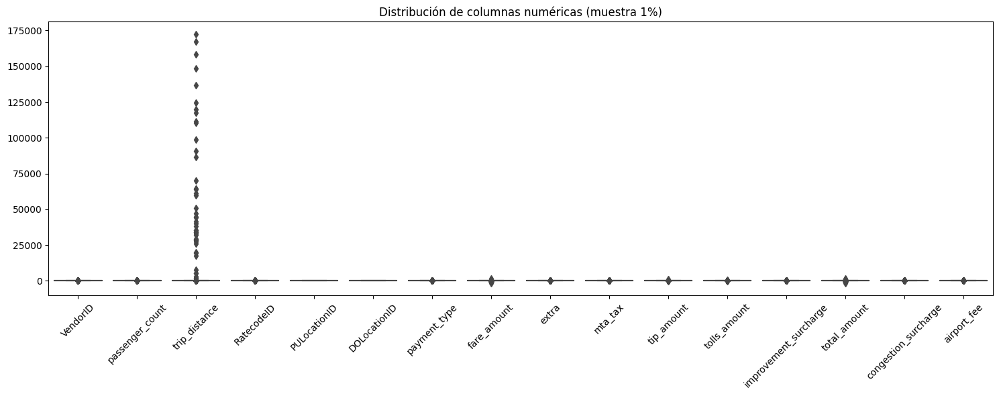

In [0]:

# Seleccionar solo columnas numéricas
numeric_cols = [col for col, dtype in df.dtypes if dtype in ("double", "int")]

# Mostrar lista si quieres verla
print("Columnas numéricas:", numeric_cols)

# Muestreo del 1%
sample_df = df.select(numeric_cols).sample(0.01, seed=42).toPandas()

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 6))
sns.boxplot(data=sample_df[numeric_cols])
plt.title("Distribución de columnas numéricas (muestra 1%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



### Eliminamos columnas innecesarios

In [0]:
# Eliminar columna 'airport_fee' ya que solo tiene nulos
df = df.drop('airport_fee')
# Eliminar columna 'ratecodeid' y 'vendorid' ya que son identificadores y no nos aportan informacion interesante
df = df.drop('ratecodeid')
df = df.drop('vendorid')

### Limpiar Outliers

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col

columna = "trip_distance"
# Calcular Q1 y Q3
quantiles = df.approxQuantile(columna , [0.25, 0.75], 0.01)
q1, q3 = quantiles[0], quantiles[1]
iqr = q3 - q1

# Definir límites inferior y superior
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Filtrar los outliers
df_sin_outliers = df.filter((col(columna) >= lower_bound) & (col(columna) <= upper_bound))


In [0]:
display(df_sin_outliers)

tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
2020-01-01T00:28:15.000Z,2020-01-01T00:33:03.000Z,1.0,1.2,N,238,239,1,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5
2020-01-01T00:35:39.000Z,2020-01-01T00:43:04.000Z,1.0,1.2,N,239,238,1,7.0,3.0,0.5,1.5,0.0,0.3,12.3,2.5
2020-01-01T00:47:41.000Z,2020-01-01T00:53:52.000Z,1.0,0.6,N,238,238,1,6.0,3.0,0.5,1.0,0.0,0.3,10.8,2.5
2020-01-01T00:55:23.000Z,2020-01-01T01:00:14.000Z,1.0,0.8,N,238,151,1,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0
2020-01-01T00:01:58.000Z,2020-01-01T00:04:16.000Z,1.0,0.0,N,193,193,2,3.5,0.5,0.5,0.0,0.0,0.3,4.8,0.0
2020-01-01T00:09:44.000Z,2020-01-01T00:10:37.000Z,1.0,0.03,N,7,193,2,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0
2020-01-01T00:39:25.000Z,2020-01-01T00:39:29.000Z,1.0,0.0,N,193,193,1,2.5,0.5,0.5,0.01,0.0,0.3,3.81,0.0
2019-12-18T15:27:49.000Z,2019-12-18T15:28:59.000Z,1.0,0.0,N,193,193,1,0.01,0.0,0.0,0.0,0.0,0.3,2.81,2.5
2019-12-18T15:30:35.000Z,2019-12-18T15:31:35.000Z,4.0,0.0,N,193,193,1,2.5,0.5,0.5,0.0,0.0,0.3,6.3,2.5
2020-01-01T00:29:01.000Z,2020-01-01T00:40:28.000Z,2.0,0.7,N,246,48,1,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5


Columnas numéricas: ['passenger_count', 'trip_distance', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra', 'mta_tax', 'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount', 'congestion_surcharge']


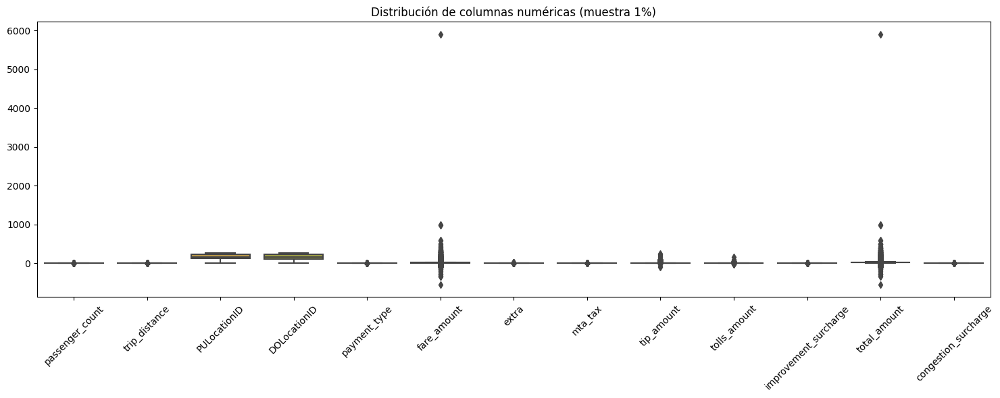

In [0]:
# Seleccionar solo columnas numéricas
numeric_cols = [col for col, dtype in df.dtypes if dtype in ("double", "int")]

# Mostrar lista si quieres verla
print("Columnas numéricas:", numeric_cols)

# Muestreo del 1%
sample_df = df_sin_outliers.select(numeric_cols).sample(0.01, seed=42).toPandas()

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 6))
sns.boxplot(data=sample_df[numeric_cols])
plt.title("Distribución de columnas numéricas (muestra 1%)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Limpiamos los nulos 

In [0]:
df_limpio = df_sin_outliers.dropna()

### AGREGACIONES

Agregamos columna 'pickup_hour'

In [0]:
from pyspark.sql.functions import col, to_timestamp, hour

# Limpieza básica
df_limpio = df.withColumn("pickup_datetime", to_timestamp(col("tpep_pickup_datetime"))).withColumn("dropoff_datetime", to_timestamp(col("tpep_dropoff_datetime"))).filter(col("pickup_datetime").isNotNull()).filter(col("passenger_count") > 0)

# Nueva columna con la hora de recogida
df_limpio = df_limpio.withColumn("pickup_hour", hour("pickup_datetime"))

In [0]:
df_limpio.columns

['tpep_pickup_datetime',
 'tpep_dropoff_datetime',
 'passenger_count',
 'trip_distance',
 'store_and_fwd_flag',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'fare_amount',
 'extra',
 'mta_tax',
 'tip_amount',
 'tolls_amount',
 'improvement_surcharge',
 'total_amount',
 'congestion_surcharge',
 'pickup_datetime',
 'dropoff_datetime',
 'pickup_hour']

Agregación de métricas por hora

In [0]:
agg_df = df_limpio.groupBy("pickup_hour").agg({"fare_amount": "avg", "trip_distance": "avg", "passenger_count": "sum"}).withColumnRenamed("avg(fare_amount)", "avg_fare").withColumnRenamed("avg(trip_distance)", "avg_distance").withColumnRenamed("sum(passenger_count)", "total_passengers")

In [0]:
display(agg_df)

pickup_hour,avg_fare,avg_distance,total_passengers
15,16.205649630231093,3.367207089857428,1.2683178E7
20,15.059852581127226,3.3336427454995863,1.0709172E7
21,15.359728120510969,3.43692005974526,1.042212E7
22,16.003654806931692,3.6332093788148594,9498565.0
17,15.553170477767518,3.0876883617407085,1.3312314E7
1,15.122172323061553,3.545638362696596,3382315.0
23,16.702099852223267,3.921056599514001,7373465.0
4,18.98960367727351,4.641778522288586,967173.0
13,15.639615499606759,3.1454664378216677,1.1399301E7
8,14.526046857293185,3.080328151398701,7187435.0


In [0]:
display(df_limpio)

tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,pickup_datetime,dropoff_datetime,pickup_hour
2020-01-01T00:28:15.000Z,2020-01-01T00:33:03.000Z,1.0,1.2,N,238,239,1,6.0,3.0,0.5,1.47,0.0,0.3,11.27,2.5,2020-01-01T00:28:15.000Z,2020-01-01T00:33:03.000Z,0
2020-01-01T00:35:39.000Z,2020-01-01T00:43:04.000Z,1.0,1.2,N,239,238,1,7.0,3.0,0.5,1.5,0.0,0.3,12.3,2.5,2020-01-01T00:35:39.000Z,2020-01-01T00:43:04.000Z,0
2020-01-01T00:47:41.000Z,2020-01-01T00:53:52.000Z,1.0,0.6,N,238,238,1,6.0,3.0,0.5,1.0,0.0,0.3,10.8,2.5,2020-01-01T00:47:41.000Z,2020-01-01T00:53:52.000Z,0
2020-01-01T00:55:23.000Z,2020-01-01T01:00:14.000Z,1.0,0.8,N,238,151,1,5.5,0.5,0.5,1.36,0.0,0.3,8.16,0.0,2020-01-01T00:55:23.000Z,2020-01-01T01:00:14.000Z,0
2020-01-01T00:01:58.000Z,2020-01-01T00:04:16.000Z,1.0,0.0,N,193,193,2,3.5,0.5,0.5,0.0,0.0,0.3,4.8,0.0,2020-01-01T00:01:58.000Z,2020-01-01T00:04:16.000Z,0
2020-01-01T00:09:44.000Z,2020-01-01T00:10:37.000Z,1.0,0.03,N,7,193,2,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0,2020-01-01T00:09:44.000Z,2020-01-01T00:10:37.000Z,0
2020-01-01T00:39:25.000Z,2020-01-01T00:39:29.000Z,1.0,0.0,N,193,193,1,2.5,0.5,0.5,0.01,0.0,0.3,3.81,0.0,2020-01-01T00:39:25.000Z,2020-01-01T00:39:29.000Z,0
2019-12-18T15:27:49.000Z,2019-12-18T15:28:59.000Z,1.0,0.0,N,193,193,1,0.01,0.0,0.0,0.0,0.0,0.3,2.81,2.5,2019-12-18T15:27:49.000Z,2019-12-18T15:28:59.000Z,15
2019-12-18T15:30:35.000Z,2019-12-18T15:31:35.000Z,4.0,0.0,N,193,193,1,2.5,0.5,0.5,0.0,0.0,0.3,6.3,2.5,2019-12-18T15:30:35.000Z,2019-12-18T15:31:35.000Z,15
2020-01-01T00:29:01.000Z,2020-01-01T00:40:28.000Z,2.0,0.7,N,246,48,1,8.0,3.0,0.5,2.35,0.0,0.3,14.15,2.5,2020-01-01T00:29:01.000Z,2020-01-01T00:40:28.000Z,0


In [0]:
#Eliminamos las columnas
df_limpio = df_limpio.drop('tpep_pickup_datetime')
df_limpio = df_limpio.drop('tpep_dropoff_datetime')

In [0]:
df_sin_outliers.write.option("header", "true").mode("overwrite").csv("/Volumes/workspace/default/data-taxi/df_sin_outliers")

In [0]:
df_limpio.write.option("header", "true").mode("overwrite").csv("/Volumes/workspace/default/data-taxi/df_limpio")

In [0]:
df.write.option("header", True).mode("overwrite").csv("/Volumes/workspace/default/data-taxi/output_csv/")

### GUARDADO DATA LAKE

In [0]:
df_limpio.write.format("delta").mode("overwrite").saveAsTable("df_limpio_delta")

In [0]:
agg_df.write.format("delta").mode("overwrite").saveAsTable("agg_df_delta")

## DASHBOARDS

📊 1. Promedio de tarifa por hora del día

In [0]:
from pyspark.sql.functions import avg

tarifa_por_hora = df_limpio.groupBy("pickup_hour").agg(avg("total_amount").alias("avg_fare"))
display(tarifa_por_hora.orderBy("pickup_hour"))


pickup_hour,avg_fare
0,23.974713225921068
1,22.1206068695572
2,20.899029326143147
3,21.68498733635583
4,26.630076463182448
5,29.905641004226695
6,24.30057538610724
7,21.704672780824158
8,21.05085079636933
9,21.234919114892683


Databricks visualization. Run in Databricks to view.

📊 2. Total de pasajeros por hora

In [0]:
from pyspark.sql.functions import sum

pasajeros_por_hora = df_limpio.groupBy("pickup_hour").agg(sum("passenger_count").alias("total_passengers"))
display(pasajeros_por_hora.orderBy("pickup_hour"))


pickup_hour,total_passengers
0,5096872.0
1,3382315.0
2,2231170.0
3,1462070.0
4,967173.0
5,1103559.0
6,2715632.0
7,5203439.0
8,7187435.0
9,8176931.0


Databricks visualization. Run in Databricks to view.

📊 3. Distancia media recorrida por hora

In [0]:
distancia_por_hora = df_limpio.groupBy("pickup_hour").agg(avg("trip_distance").alias("avg_distance"))
display(distancia_por_hora.orderBy("pickup_hour"))

pickup_hour,avg_distance
0,3.9327300713264326
1,3.545638362696585
2,3.336360405233996
3,3.4828354049237835
4,4.641778522288583
5,6.224888582945036
6,4.6007794511899025
7,3.5293210019394525
8,3.080328151398693
9,3.0163479438681926


Databricks visualization. Run in Databricks to view.

Cerramos la sesion una vez terminado todo.

In [0]:
# Cerrar la sesión de Spark
#spark.stop()